In [1]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from hmm import HMM
from emission import DiscreteEmission

np.set_printoptions(linewidth=100, suppress=True)

%matplotlib inline
plt.rcParams['animation.html'] = 'jshtml'

## Model setup

In [2]:
seed = 10

In [3]:
# model dimensions
N_STATE = 3
OBS_SIZE = 5

# true model to generate data
hmm_true = HMM(N_STATE, DiscreteEmission(N_STATE, OBS_SIZE))
hmm_true.gen_params(random_state=seed)

In [4]:
# stationary distribution to check no state is too rare
np.linalg.matrix_power(hmm_true.transition_mat, 1024)

array([[0.47542773, 0.27833207, 0.2462402 ],
       [0.47542773, 0.27833207, 0.2462402 ],
       [0.47542773, 0.27833207, 0.2462402 ]])

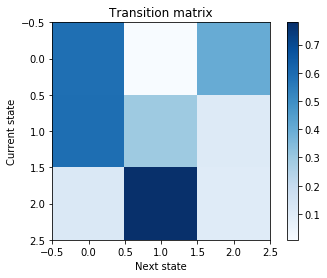

In [5]:
# heatmap of transition matrix
plt.imshow(hmm_true.transition_mat, cmap='Blues', interpolation='nearest')
plt.ylabel('Current state'); plt.xlabel('Next state'); plt.title('Transition matrix')
plt.colorbar();

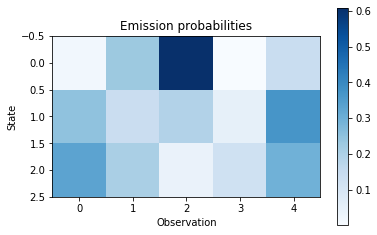

In [6]:
# heatmap of emission probabilities
plt.imshow(np.exp(hmm_true.emission_model.params), cmap='Blues', interpolation='nearest')
plt.ylabel('State'); plt.xlabel('Observation'); plt.title('Emission probabilities');
plt.colorbar();

## Decoding a sequence

In [7]:
# generate one sequence
SEQLEN = 2000
data = hmm_true.random_seq(SEQLEN, random_state=seed)

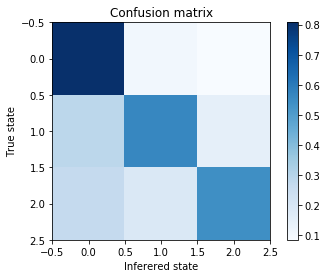

In [8]:
inferred = hmm_true.viterbi(data)

counts = np.zeros((N_STATE, N_STATE))
for t, i in zip(hmm_true.state_seq, inferred):
    counts[t,i] += 1

plt.imshow(counts / counts.sum(axis=1)[:,np.newaxis], cmap='Blues', interpolation='nearest')
plt.ylabel('True state')
plt.xlabel('Inferered state')
plt.title('Confusion matrix')
plt.colorbar();

State 0 has quite a different emission distribution to the other states. It has a high probability for observation 2, which may explain why it is the most accurately predicted state.

In [9]:
print('  '.join(('Obs', 'True', 'Inferred')))
for obs, t, i in zip(data, hmm_true.state_seq, inferred):
    print(f'{obs:3}{t:6}{i:10}')

Obs  True  Inferred
  3     2         1
  2     0         0
  2     2         0
  0     1         2
  2     0         1
  2     0         0
  2     0         0
  1     2         2
  0     1         1
  1     0         0
  3     2         2
  4     2         1
  4     0         1
  2     0         0
  4     2         2
  0     1         1
  2     1         0
  2     0         0
  0     2         2
  1     1         1
  2     0         0
  2     0         0
  0     0         2
  0     2         1
  1     1         0
  2     0         0
  0     2         2
  0     1         1
  0     1         2
  4     1         1
  4     1         1
  2     0         0
  4     2         2
  4     1         1
  4     0         1
  4     0         1
  2     0         0
  1     2         0
  0     0         2
  0     2         1
  3     1         2
  0     1         1
  2     0         0
  1     2         0
  1     1         2
  0     1         1
  2     0         0
  4     2         2
  1     1         1


  4     0         1
  2     0         0
  2     0         0
  1     0         0
  4     2         2
  4     1         1
  2     0         0
  1     0         0
  2     0         0
  2     0         0
  2     0         0
  3     2         2
  2     2         0
  4     2         2
  0     1         1
  2     0         0
  0     2         2
  0     2         1
  4     1         1
  2     0         0
  3     2         2
  2     1         1
  4     0         1
  1     2         0
  2     0         0
  4     0         0
  3     2         2
  4     1         1
  4     2         0
  0     1         2
  1     0         1
  1     0         0
  1     0         0
  1     0         2
  0     2         1
  2     1         0
  4     1         2
  4     1         1
  1     0         0
  0     2         2
  4     0         1
  4     0         1
  1     0         0
  0     2         2
  4     1         1
  2     0         0
  1     2         0
  1     1         0
  1     1         2
  0     1         1


## Parameter inference

In [10]:
# these objects have no access to the generated model parameters
hmm_fit = HMM(N_STATE, DiscreteEmission(N_STATE, OBS_SIZE))
hmm_fit.gen_params(random_state=seed+1)
logl, iter_params = hmm_fit.baum_welch(data, 200);

iterations: 50 100 150 200 


In [11]:
# compare emission probabilities
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(14, 4))

ax = axes[0]
im = ax.imshow(np.exp(hmm_true.emission_model.params), cmap='Blues', interpolation='nearest', vmin=0, vmax=0.65)
ax.set_ylabel('State'); ax.set_xlabel('Observation'); ax.set_title('Original emission probabilities')

ax = axes[1]
im = ax.imshow(np.exp(iter_params[0]), cmap='Blues', interpolation='nearest', vmin=0, vmax=0.65)
ax.set_ylabel('State'); ax.set_xlabel('Observation'); ax.set_title('Fitted emission probabilities')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.025, 0.7])
fig.colorbar(im, cax=cbar_ax)

def update(idx):
    im.set_array(np.exp(iter_params[idx]))
    return [im]
        
ani = FuncAnimation(fig, update, frames=range(len(iter_params)), blit=True, interval=50)
plt.close()

ani

The rows above can be reshuffled to match up. These is done below to compare the transition matrices. The performance doesn't seem great, so we'll try multiple initialisations.

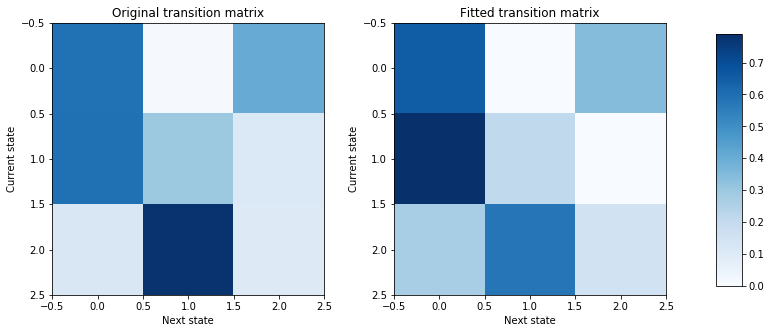

In [12]:
# compare transition matrices
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12, 5))

perm = [2, 0, 1]
vmax = max(hmm_true.transition_mat.max(), hmm_fit.transition_mat.max())

ax = axes[0]
im = ax.imshow(hmm_true.transition_mat, cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Original transition matrix')

ax = axes[1]
im = ax.imshow(hmm_fit.transition_mat[perm,:][:,perm], cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Fitted transition matrix')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
fig.colorbar(im, cax=cbar_ax);

## Multiple EM initialisations

In [13]:
results = []
for run in range(1, 11):
    hmm_fit = HMM(N_STATE, DiscreteEmission(N_STATE, OBS_SIZE))
    hmm_fit.gen_params(random_state=seed+run)
    res = hmm_fit.baum_welch(data, 200)
    results.append((*res, hmm_fit))

iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 
iterations: 50 100 150 200 


In [14]:
# log likelihoods
[r[0] for r in results]

[-2926.0352915871017,
 -2932.7354789538017,
 -2927.2847720020372,
 -2925.278610823046,
 -2933.1536362270654,
 -2933.781029066385,
 -2927.3834459260197,
 -2928.4254458382925,
 -2938.519319143451,
 -2925.206446830822]

In [15]:
best = max(results)

In [16]:
# compare emission probabilities
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(14, 4))

ax = axes[0]
im = ax.imshow(np.exp(hmm_true.emission_model.params), cmap='Blues', interpolation='nearest', vmin=0, vmax=0.65)
ax.set_ylabel('State'); ax.set_xlabel('Observation'); ax.set_title('Original emission probabilities')

ax = axes[1]
im = ax.imshow(np.exp(best[1][0]), cmap='Blues', interpolation='nearest', vmin=0, vmax=0.65)
ax.set_ylabel('State'); ax.set_xlabel('Observation'); ax.set_title('Fitted emission probabilities')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.025, 0.7])
fig.colorbar(im, cax=cbar_ax)

def update(idx):
    im.set_array(np.exp(best[1][idx]))
    return [im]
        
ani = FuncAnimation(fig, update, frames=range(len(best[1])), blit=True, interval=50)
plt.close()

ani

The rows above can be reshuffled to match up. These is done below to compare the transition matrices. The best case only slightly improves the inferred values of the transition matrix. It is difficult to tell whether the emission distributions are any better.

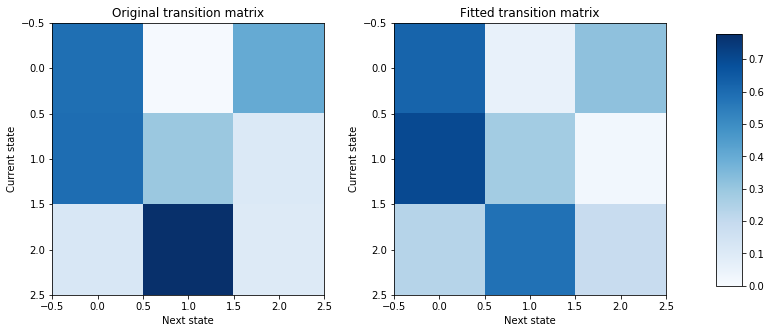

In [17]:
# compare transition matrices
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12, 5))

perm = [2, 0, 1]
vmax = max(hmm_true.transition_mat.max(), best[2].transition_mat.max())

ax = axes[0]
im = ax.imshow(hmm_true.transition_mat, cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Original transition matrix')

ax = axes[1]
im = ax.imshow(best[2].transition_mat[perm,:][:,perm], cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Fitted transition matrix')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
fig.colorbar(im, cax=cbar_ax);